# Ejercicios de Procesamiento Digital de Imágenes

## Ejercicio 1: Espacios de Color

Usando una imagen a color de su elección:

a) Cargar la imagen con OpenCV y mostrar los canales BGR por separado. 
b) Identificar cuál de los tres canales tiene mayor información basándose en los valores promedio. 
c) Convertir la imagen de BGR a RGB y explicar por qué los colores se ven diferentes antes y después de la conversión.

## Ejercicio 2: Muestreo y Cuantización

a) Aplicar muestreo espacial a una imagen con factores de 2, 4 y 8. 
b) Para cada caso, calcular:

    El nuevo tamaño de la imagen
    El porcentaje de reducción de datos 

c) Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256) 
d) ¿En qué nivel de cuantización comienza a ser visible la degradación de la imagen?

## Ejercicio 3: Segmentación por Color

Dada una imagen con objetos de diferentes colores:

a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB. 
b) Calcular y mostrar el histograma de la imagen en escala de grises. 
c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado. 
d) Dibujar los bordes del objeto segmentado en color rojo.

### Criterios de Evaluación:

Correcta implementación del código (40%)
Comprensión de los conceptos teóricos demostrada en las explicaciones (30%)
Análisis de resultados y conclusiones (20%)
Claridad en la presentación de resultados (10%)

## Instalación e importación de librerías

Estoy trabajando en Deepnote, es un entorno de Jupyter notebook, por lo tanto agregue algunos comandos necesarios para que se pueda ejecutar este cuaderno.

In [1]:
## en caso de un error tuve que correr el siguiente bloque

!apt-get update && apt-get install -y libgl1-mesa-glx -q
!apt-get install -y libglib2.0-0 -q
!pip install opencv-python
# !pip install scikit-image


Hit:1 http://deb.debian.org/debian bullseye InRelease
Get:2 http://deb.debian.org/debian-security bullseye-security InRelease [27.2 kB]
Hit:3 http://deb.debian.org/debian bullseye-updates InRelease
Fetched 27.2 kB in 1s (39.1 kB/s)

Reading package lists...
Building dependency tree...
Reading state information...
libgl1-mesa-glx is already the newest version (20.3.5-1).
0 upgraded, 0 newly installed, 0 to remove and 47 not upgraded.
Reading package lists...
Building dependency tree...
Reading state information...
libglib2.0-0 is already the newest version (2.66.8-1+deb11u6).
libglib2.0-0 set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 47 not upgraded.

[notice] A new release of pip is available: 23.0.1 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

OpenCV es una librería especializada en procesamiento de imágenes y visión por computador

Matplotlib es una librería de visualización que permite graficar datos y mostrar imágenes. 

NumPy es una librería para operaciones matemáticas y manipulación de arreglos. En el contexto de imágenes, es muy útil porque OpenCV trata imágenes como arreglos NumPy.

### Funciones auxiliares

Arme algunas funciones donde se repetía código. Esto me permite reutilizar y reducir de lineas de código.

In [3]:
def info_imagen(imagen):
    print("Mínimo:", imagen.min())
    print("Máximo:", imagen.max())
    print("Dimensiones de la imagen:", imagen.shape)
    print("Tipo de datos:", imagen.dtype)
    print("Tamaño en memoria BGR(bytes):", imagen.nbytes)


def mostrar_imagen(imagen, titulo, gama='gray',figsize=None):
    plt.figure(figsize=figsize)
    plt.title(titulo)
    plt.imshow(imagen, cmap=gama)
    plt.show()

canales_RGB = {'Rojo': 0, 'Verde': 1, 'Azul': 2}
canales_BGR = {'Azul': 0, 'Verde': 1, 'Rojo': 2}

def obtener_canal(imagen, canal, es_RGB=True):
    if es_RGB:
        return imagen[:, :, canales_RGB[canal]]
    else:
        return imagen[:, :, canales_BGR[canal]]

def mostrar_estadisticas_canal_imagen(imagen, canal):
    print(f"Estadísticas del canal {canal}:")
    print(f"Valor mínimo: {imagen.min()}, Valor máximo: {imagen.max()}, Promedio: {imagen.mean():.2f}")


def obtener_tonos_unicos_imagen(imagen):
    tonos_unicos = np.unique(imagen)  # Obtiene los valores únicos de píxeles
    return tonos_unicos

# Ejercicio 1: Espacios de Color

## Selección de una imagen

Seleccione una imagen del repositorio de Berkeley, que contenga varios tonos para poder apreciar los canales de colores para el desarrollo del ejercicio https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300/html/dataset/images/color/140055.html

In [4]:
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300/html/images/plain/normal/color/140055.jpg -O "parque-con-flores.jpg"

## Uso de OpenCV

Cargo la imagen descargada y muestro los datos.

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (321, 481, 3)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 463203


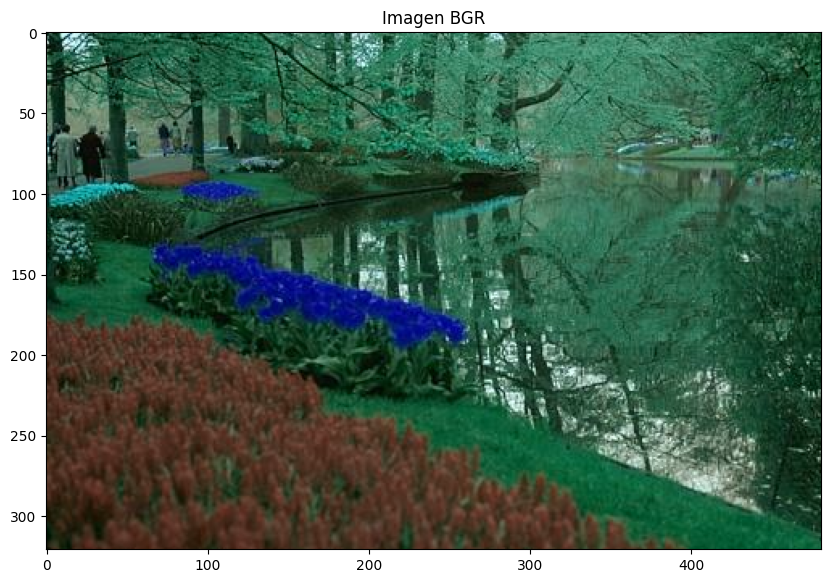

In [5]:
imagen = cv2.imread('parque-con-flores.jpg')

info_imagen(imagen)

mostrar_imagen(imagen, "Imagen BGR", figsize=(10, 8))

La imagen posee mínimo 0 y máximo 255, esto se refiere al color, 0 es la ausencia de luz, y 255 es la maxima intensidad, cada pixel de la imagen posee valores para cada canal. 

Las medidas son de 321x481 píxeles. Se puede observar que los colores de la imagen se muestra invertida, dado que la libreria OpenCV lee la imagen como BGR en lugar de RGB. Vamos a desarrollar más adelante como corregir el color.

## Canales BGR

La imagen se compone por tres canales de colores: Blue-Azul, Green-Verde, Red-Rojo. 

Cada uno de estos canales representa una capa que posee la intensidad de ese color, van de 0 a 255, siendo cero baja intensidad o ausencia  de luz y 255 alta intensidad del color.

En este caso estamos hablando del canal BGR que es como lo utliza OpenCV, el canal del Rojo y azul están invertidos, a pesar de que el verde se mantiene en la posición del medio también se puede percibir que esta alterado en su tonalidad.

Vamos a ver los canales uno por uno transformando la imagen a escala de grises y viendo la intensidad de cada uno.

### Canal Azul

Estadísticas del canal Azul:
Valor mínimo: 0, Valor máximo: 236, Promedio: 51.03


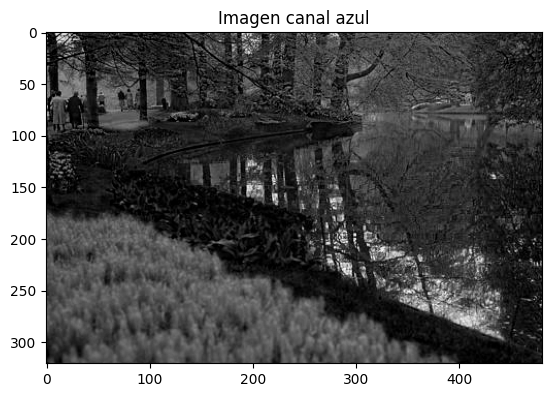

In [6]:
canal_azul = obtener_canal(imagen, 'Azul', es_RGB=False)
mostrar_estadisticas_canal_imagen(canal_azul, 'Azul')
mostrar_imagen(canal_azul, "Imagen canal azul")

Dentro del rango del canal azul de la imagen, que va del 0 al 236, siendo el cero el que se aleja de la intensidad del color azul y 255 el máximo, que indica mayor presencia del azul. Esta imagen no posee un color azul con la total intensidad para llegar a 255, que en esta imagen se vería con una tonalidad cercana al blanco por ser escala de grises. 

El promedio nos da 51.3 esta por debajo de la mitad de 255, esto me da una idea de que existe una menor presencia del color azul en esta imagen. Si ponemos atención a la imagen se podrá observar que la imagen es bastante opaca. Y si lo comparamos con la imagen original tiene relación ya que predomina el verde que pertenece a otro canal de los colores primarios.

### Canal Verde

Estadísticas del canal Verde:
Valor mínimo: 0, Valor máximo: 255, Promedio: 85.02


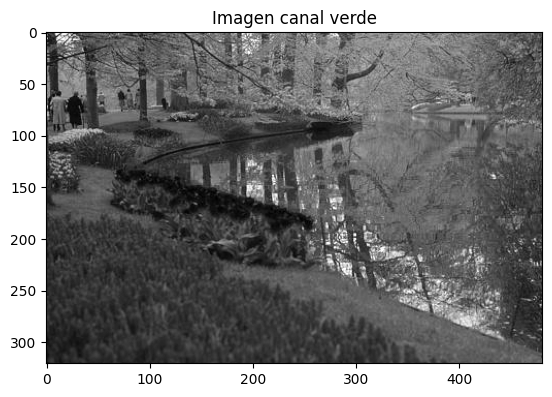

In [7]:
canal_verde = obtener_canal(imagen, 'Verde', es_RGB=False)
mostrar_estadisticas_canal_imagen(canal_verde, 'Verde')
mostrar_imagen(canal_verde, "Imagen canal verde")

Analizando los valores obtenidos, se puede ver que en la imagen el canal verde va desde el cero, con menos intensidad al máximo, 255, siendo su promedio unos 85.02, esto implica que la imagen posee mayor intensidad verde que en canal azul, pero aún así no es completamente predominante el color, esto se puede deberse a la intensidad del verde, si bien si predomina en la foto, no lo hace completamente por los espacios que tiene, y así mismo no tiene la intensidad del color.

### Canal Rojo

Estadísticas del canal Rojo:
Valor mínimo: 0, Valor máximo: 255, Promedio: 65.13


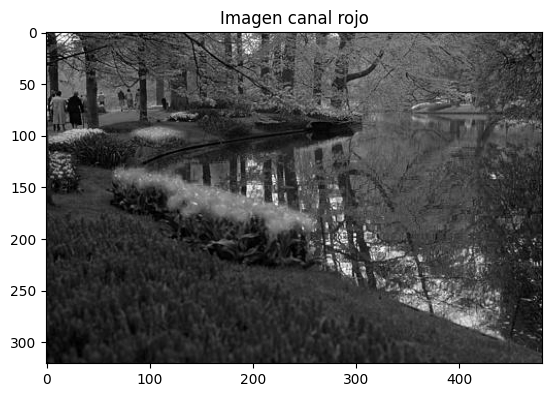

In [8]:
canal_rojo = obtener_canal(imagen, 'Rojo', es_RGB=False)
mostrar_estadisticas_canal_imagen(canal_rojo, 'Rojo')
mostrar_imagen(canal_rojo, "Imagen canal rojo")

El canal rojo va desde el cero al 255, siendo su promedio 65.13, mayor que el canal azul y menor que el canal verde. Si bien en la foto original no predomina el color rojo, el hecho que el promedio se mayor que el azul puede deberse a que es utilizado para completar el color.

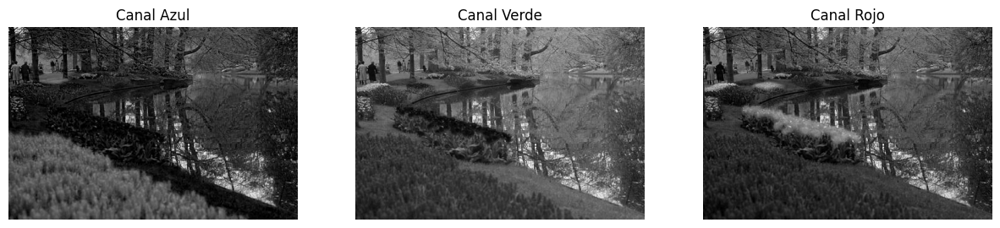

In [9]:
# Crear la figura con los tres canales
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)  # 1 fila, 3 columnas, imagen 1
plt.imshow(canal_azul, cmap='gray')
plt.title("Canal Azul")
plt.axis("off")

plt.subplot(1, 3, 2)  # Imagen 2
plt.imshow(canal_verde, cmap='gray')
plt.title("Canal Verde")
plt.axis("off")

plt.subplot(1, 3, 3)  # Imagen 3
plt.imshow(canal_rojo, cmap='gray')
plt.title("Canal Rojo")
plt.axis("off")

plt.show()

Luego de analizar las fotos se puede apreciar que todas las fotos poseen una sección blanca en el mismo lugar, esto se debe a que cuando se obtiene el máximo de intensidad en los tres canales se generá el color blanco.

## Conversión BGR a RGB

Esto implica que los colores que deberían verse con las tonalidades de rojo sean azules y viceversa.

Ahora voy a invertir los canales para que se vea la imagen original

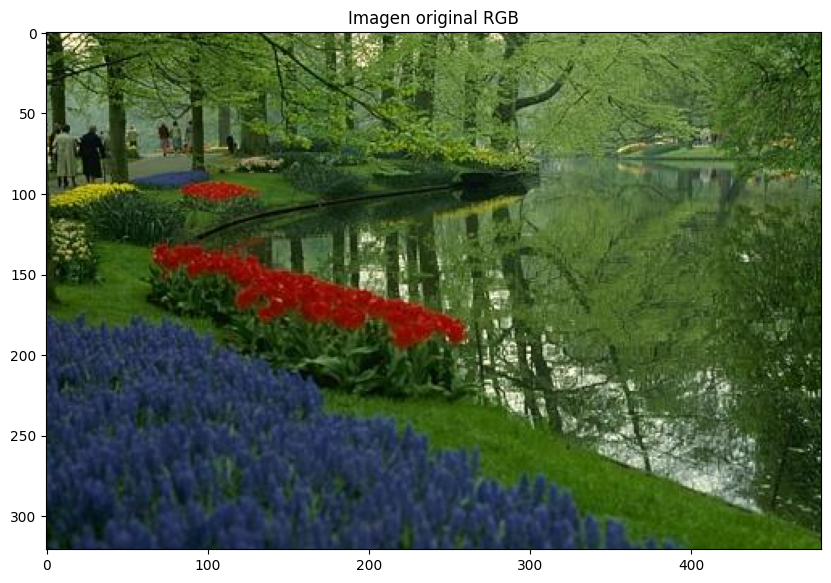

In [10]:
imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)
mostrar_imagen(imagen_rgb, "Imagen original RGB", figsize=(10, 10))

La imagen no solo se ve distinta por las tonalidades de azul y rojo, sino que también el verde tenia otra tonalidad, esto es porque dentro de la imagen no todo lo verde es puramente color verde, sino una combinación entre los tres canales.

## Conclusión

Luego de realizar el ejercicio de color pude ver la diferencia entre trabajar con la gama de RGB y BGR, con las distintas librerías, en este caso para leer la imagen se utilizo OpenCV, que transforma la imagen y los muestra en el formato BGR. OpenCV tiene la función de mostrar la imagen utilizando la función:

cv2_imshow(img)

Por motivos de compatibilidad lo reemplace con el uso de matplotlib, y al mostrar la imagen se puede ver que utiliza los canales RGB, dando como resultado una imagen distorsionada. Esto debe ser tomado en cuenta al momento de analizar una imagen. 

En el caso de la intensidad de color vi que dos de los canales llegaban a 255, y uno a 236, pero esos correspondían a la formación del color cercano al blanco, y no exclusivamente al color.

# Ejercicio 2: Muestreo y Cuantización

### Selección de imagen

Elegí una imagen en escala de grises dentro del repositorio de Berkeley

In [11]:
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300/html/images/plain/normal/gray/323016.jpg -O "astronautas-bn.jpg"

### Información de la imagen

In [12]:
imagen_astro = cv2.imread('astronautas-bn.jpg')
info_imagen(imagen_astro)

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (321, 481, 3)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 463203


La imagen posee un mínimo es 0 y llega al máximo de intensidad, esto se puede ver reflejado en la imagen donde se puede ver el color negro de los bordes, y el máximo de intensidad en el blanco del traje de los astronautas.

## Selección de un canal

En este caso, al ser una imagen en escala de grises, no hay deferencia de elegir entre un canal u otro. Los valores son de intensidad de luz

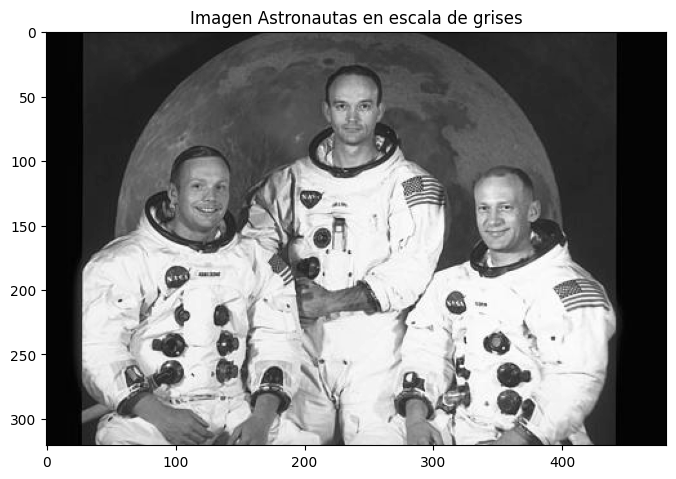

In [13]:
imagen_astro_canal_0 = obtener_canal(imagen_astro, 'Azul', es_RGB=False)
mostrar_imagen(imagen_astro_canal_0, titulo="Imagen Astronautas en escala de grises", figsize=(8, 8))

## Muestreo espacial

El muestreo espacial tiene varias aplicaciones, entre ellas:

Reducción de resolución: Disminuir la cantidad de píxeles en una imagen sin perder demasiada información. Esto es útil para optimizar almacenamiento y transmisión de datos.

 Interpolación y escalamiento: Al cambiar la densidad de muestreo, se puede aumentar o reducir el tamaño de una imagen sin distorsionar demasiado los detalles.

Segmentación y análisis de imágenes: Ayuda en la detección de bordes, reconocimiento de objetos y clasificación de patrones.

Compresión de imágenes: Afecta cómo se representan los datos en algoritmos de compresión como JPEG, reduciendo la cantidad de información redundante.

Procesamiento en visión por computadora: Se utiliza en aplicaciones de inteligencia artificial y visión artificial para mejorar la interpretación de imágenes en sistemas de reconocimiento facial, vehículos autónomos y más.

Si el muestreo espacial es demasiado bajo, la imagen puede perder detalles y volverse borrosa o pixelada. Por otro lado, un muestreo espacial más alto proporciona mayor calidad, pero requiere más almacenamiento y poder de procesamiento.

Se inicializan tres valores por los cuales vamos a transformar a la imagen. 

In [14]:
d1 = 2   # Factor de muestreo: toma 1 pixel cada 2 pixeles
d2 = 4   # Factor de muestreo: toma 1 pixel cada 4 pixeles
d3 = 8   # Factor de muestreo: toma 1 pixel cada 8 pixeles

In [15]:
def muestreo_espacial(X, d):
    (Nx,Mx) = X.shape          # Obtiene dimensiones de imagen original
    ix = range(0,Nx,d)         # Crea secuencia de 0 a Nx saltando de d en d
    jx = range(0,Mx,d)         # Igual para columnas
    Ny = len(ix)               # Nueva altura = número de filas a tomar
    My = len(jx)               # Nueva anchura = número de columnas a tomar
    print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')
    reduccion = (1 - (Ny * My) / (Nx * Mx)) * 100
    print(f'Porcentaje de reducción de datos: {reduccion:.2f}%')
    # Crea nueva imagen muestreada
    Y = np.zeros((Ny,My), np.uint8)  # Matriz vacía de enteros 0-255
    for i in range(Ny):              # Para cada fila
        for j in range(My):          # Para cada columna
            Y[i,j] = X[ix[i],jx[j]]  # Copia el pixel correspondiente
    
    return Y

## Factor 2

Resolución reducida de 321x481 a 161x241 pixels
Porcentaje de reducción de datos: 74.87%


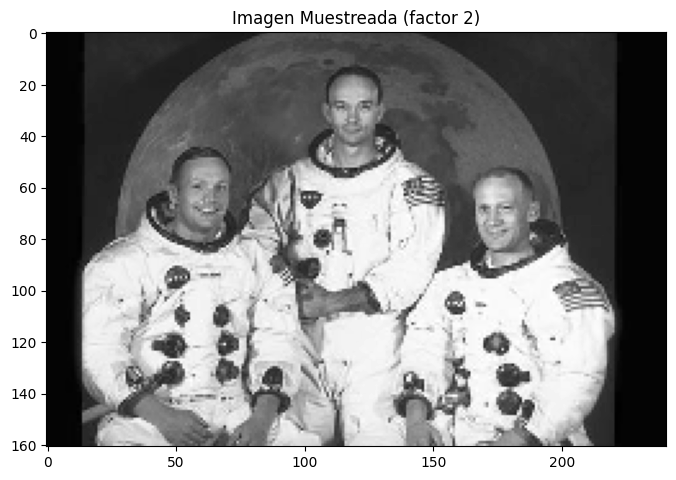

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (161, 241)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 38801


In [16]:
img_d1 = muestreo_espacial(imagen_astro_canal_0, d1)
mostrar_imagen(img_d1, f'Imagen Muestreada (factor {d1})', figsize=(8,8))
info_imagen(img_d1)

Luego de la transformación la imagen se redujo al 74.87%, se ve un poco pixelada, pero se siguen manteniendo la definición de los bordes de los  objetos mas grandes. tal vez en los ojos se puede ver que esta perdiendo datos.

## Factor 4

Resolución reducida de 321x481 a 81x121 pixels
Porcentaje de reducción de datos: 93.65%


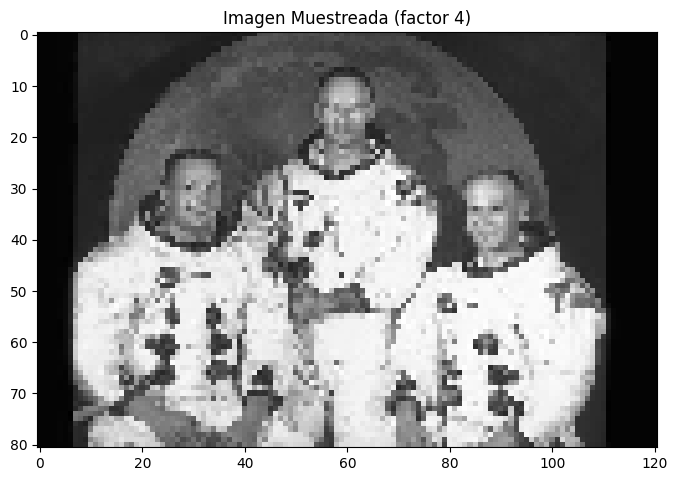

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (81, 121)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 9801


In [17]:
img_d2 = muestreo_espacial(imagen_astro_canal_0, d2)
mostrar_imagen(img_d2, f'Imagen Muestreada (factor {d2})', figsize=(8,8))
info_imagen(img_d2)

La imagen se redujo a 81x121 pixeles, y se puede apreciar que se los bordes de los objetos, en este caso los astronautas ya se ven pixelados, la definición del rostro se ve muy pixelada, casi irreconocible, aún se puede diferenciar entre los distintos  objetos.

## Factor 8

Resolución reducida de 321x481 a 41x61 pixels
Porcentaje de reducción de datos: 98.38%


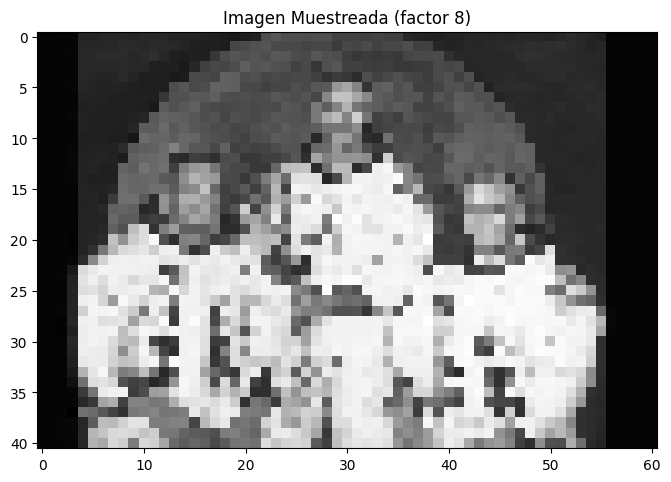

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (41, 61)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 2501


In [18]:
img_d3 = muestreo_espacial(imagen_astro_canal_0, d3)
mostrar_imagen(img_d3, f'Imagen Muestreada (factor {d3})', figsize=(8,8))
info_imagen(img_d3)

Esta imagen perdió el 98.38% de datos, ahora ya es un poco difícil diferenciar los limites de los objetos pero aún se pueden seguir diferenciando que hay tres siluetas y la imagen de la luna por detrás.

In [19]:
info_imagen(imagen_astro_canal_0)
info_imagen(img_d1)
info_imagen(img_d2)
info_imagen(img_d3)
im_total = [img_d1, img_d2, img_d3]

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (321, 481)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 154401
Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (161, 241)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 38801
Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (81, 121)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 9801
Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (41, 61)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 2501


## Conclusión

Parte de las ventajas que el muestreo espacial luego de la reducción es que se consume menos memoria y eso se puede reflejado ver si comparamos la el tamaño de la imagen original 154401, y la imagen con el d=8, 2501 bytes. Con un factor de dos, se pierde un poco la definición  de los objetos pequeños como los detalles de los trajes y los ojos, pero si vemos la imagen transformada con d=8, la imagen esta totalmente pixelada, perdiendo mucha información.

# Cuantización

La cuantización reduce el número de niveles de gris en la imagen. Es el proceso de convertir valores continuos en valores discretos. En el contexto del procesamiento de imágenes, se utiliza para reducir la cantidad de información que representa una imagen, asignando rangos de valores continuos a un conjunto limitado de valores posibles.

In [20]:
#  Factor de cuantización (32, 64, 128, 256) 
q1 = 32
q2 = 64
q3 = 128
q4 = 256


In [21]:
def cuantizar_imagen(img_X, q):
    # Divide por q, redondea hacia abajo y multiplica por q
    Z = np.floor(img_X/q)*q      # Agrupa valores en intervalos de tamaño q
    Z = Z.astype(np.uint8)   # Convierte a enteros 0-255
    print(f'Esta imagen tiene {int(256/q)} niveles de gris (original: 255)')

    return Z


### Cuantización q = 32

Esta imagen tiene 8 niveles de gris (original: 255)


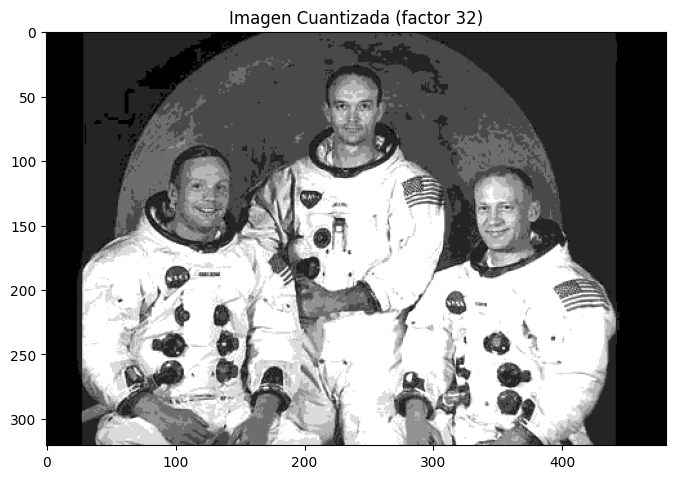

Mínimo: 0
Máximo: 224
Dimensiones de la imagen: (321, 481)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 154401


In [22]:
img_q1 = cuantizar_imagen(imagen_astro_canal_0, q1)
mostrar_imagen(img_q1, f'Imagen Cuantizada (factor {q1})', figsize=(8,8))
info_imagen(img_q1)

Se puede apreciar el cambio en la imagen, pero se sigue viendo los detalles de los trajes y los rasgos faciales. Siendo que ahora lo componen 8 tonos de grises

### Cuantización q = 64

Esta imagen tiene 4 niveles de gris (original: 255)


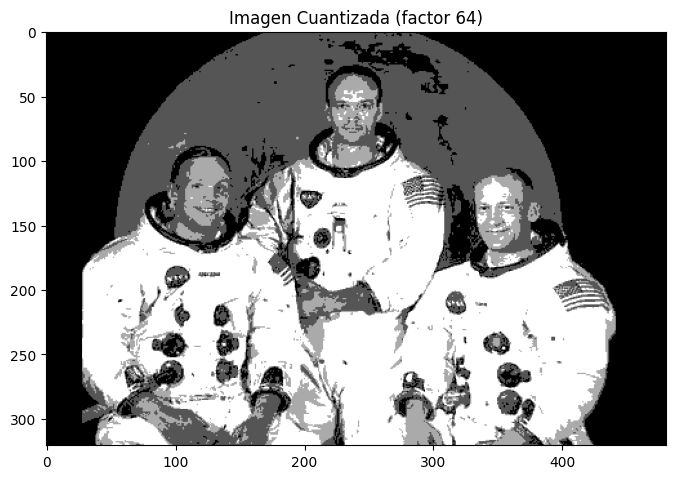

Mínimo: 0
Máximo: 192
Dimensiones de la imagen: (321, 481)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 154401


In [23]:
img_q2 = cuantizar_imagen(imagen_astro_canal_0, q2)
mostrar_imagen(img_q2, f'Imagen Cuantizada (factor {q2})', figsize=(8,8))
info_imagen(img_q2)

Luego de la cuantización se puede ver los rostros de los astronautas se ven diferente, resaltando las areas de luz y opacando las otras areas, esta imagen esta compuesta por 4 tonalidades. Se puede distinguir los 4 objetos.

### Cuantización q = 128

Esta imagen tiene 2 niveles de gris (original: 255)


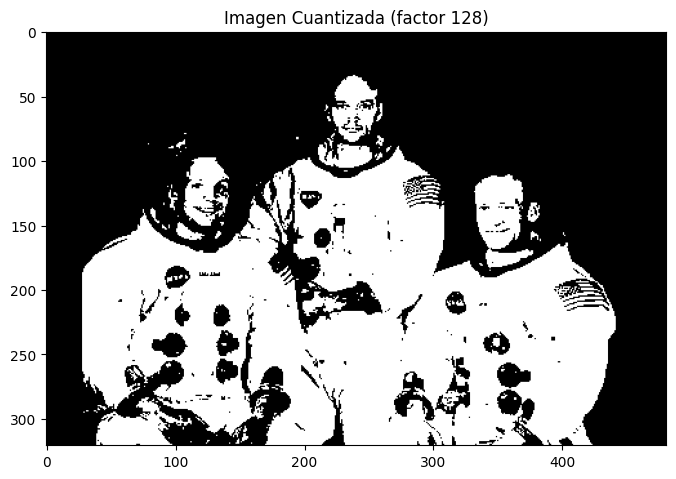

Mínimo: 0
Máximo: 128
Dimensiones de la imagen: (321, 481)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 154401


In [24]:
img_q3 = cuantizar_imagen(imagen_astro_canal_0, q3)
mostrar_imagen(img_q3, f'Imagen Cuantizada (factor {q3})', figsize=(8,8))
info_imagen(img_q3)


Esta imagen esta compuesta por dos tonalidades, el negro y el gris medio, 0 y 128 respectivamente. En cuanto a tamaño en bytes no se vio afectado 

## Cuantización q = 256

Esta imagen tiene 1 niveles de gris (original: 255)


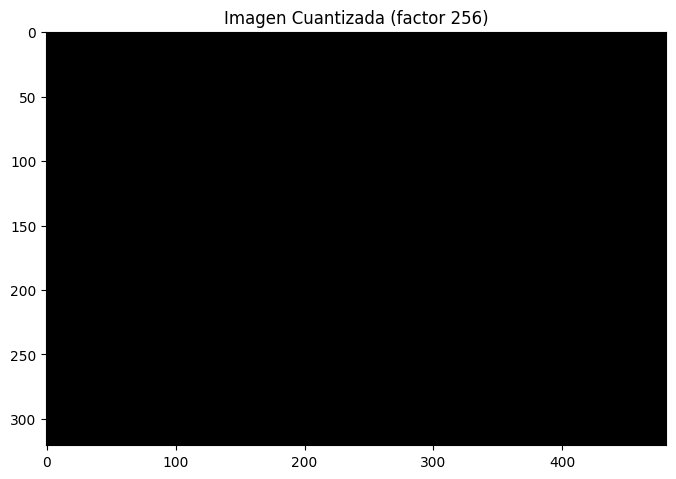

Mínimo: 0
Máximo: 0
Dimensiones de la imagen: (321, 481)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 154401


In [25]:
img_q4 = cuantizar_imagen(imagen_astro_canal_0, q4)
mostrar_imagen(img_q4, f'Imagen Cuantizada (factor {q4})', figsize=(8,8))
info_imagen(img_q4)

El calculo de la cuantización de la imagen da como resultado 1, por eso es que se ve un solo color

### Histograma de la imagen

El histograma muestra la distribución de los niveles de gris en la imagen.

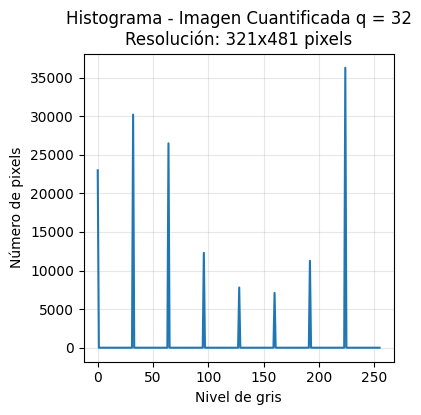

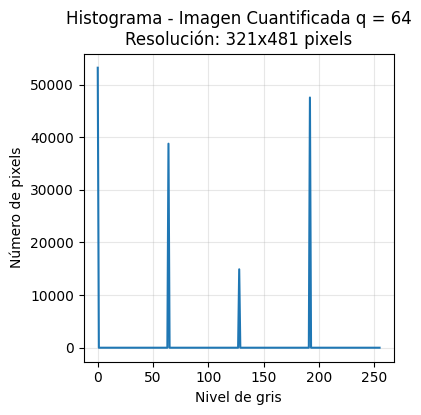

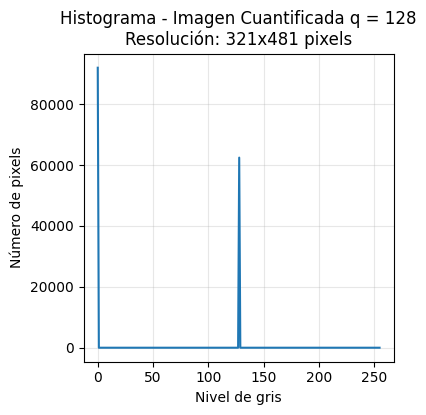

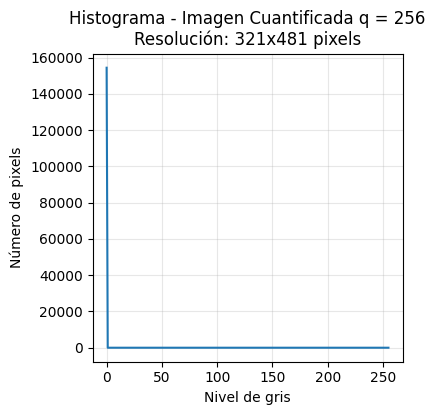

In [26]:
def hist(img):
    h = np.zeros(256)           # Vector para contar ocurrencias
    for i in range(img.shape[0]):    # Para cada fila
        for j in range(img.shape[1]): # Para cada columna
            h[img[i,j]] += 1         # Incrementa contador del valor
    return h

def mostrar_histograma(img, tipo_transformacion):
    # Histograma imagen muestreada
    plt.figure(figsize=(4, 4))
    plt.plot(hist(img))
    Ny, My = img.shape
    plt.title(f'Histograma - Imagen {tipo_transformacion}\nResolución: {Ny}x{My} pixels')
    plt.xlabel('Nivel de gris')
    plt.ylabel('Número de pixels')
    plt.grid(True, alpha=0.3)
    plt.show()

mostrar_histograma(img_q1, "Cuantificada q = 32")
mostrar_histograma(img_q2, "Cuantificada q = 64")
mostrar_histograma(img_q3, "Cuantificada q = 128")
mostrar_histograma(img_q4, "Cuantificada q = 256")


A partir de q=64 la imagen se ve distorcionada. Si bien desde q=32 se puede percibir un cambio, yo creo que aun se mantiene bastante bien.

# Ejercicio 3: Segmentación por Color

Dada una imagen con objetos de diferentes colores:

a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB. 
b) Calcular y mostrar el histograma de la imagen en escala de grises. 
c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado. 
d) Dibujar los bordes del objeto segmentado en color rojo.


In [27]:
#import skimage as ski
%matplotlib inline 

### Funciones Auxiliares

Implementación de funciones auxiliares que ayudarán a reutilizar código

In [28]:
def seleccionar_min_max_color_array(lista):
    pixeles = np.array(lista, dtype=np.uint8)

    # Calcular mínimos y máximos en cada canal
    color_min = np.min(pixeles, axis=0)  # Mínimos en cada canal RGB
    color_max = np.max(pixeles, axis=0)  # Máximos en cada canal RGB
    print(f"Rango mínimo: {color_min}")
    print(f"Rango máximo: {color_max}")
    return np.array([color_min], dtype=np.uint8), np.array([color_max], dtype=np.uint8)

def comparar_imagenes_grilla(img_original,img1, img2, titulo_img1, titulo_img2, titulo_img_original="Imagen original"):
    # Mostrar imagen segmentada
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img_original)
    axes[0].set_title(titulo_img_original)
    axes[0].axis("off")

    axes[1].imshow(img1, cmap="gray")
    axes[1].set_title(titulo_img1)
    axes[1].axis("off")

    axes[2].imshow(img2)
    axes[2].set_title(titulo_img2)
    axes[2].axis("off")
    plt.tight_layout()  
    plt.show()

def comparar_histograma_rgb(img, titulo):
    canales = ('Rojo', 'Verde', 'Azul')
    colores = ('red', 'green', 'blue')
    for i, color in enumerate(colores):
        hist = cv2.calcHist([img],[i],None,[256],[0,256]) 
        plt.plot(hist, color=color, label=canales[i])

    plt.title("Histograma de cada canal RGB")
    plt.xlabel("Valor de intensidad")
    plt.ylabel("Número de píxeles")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.show()

## Selección de imagen

Seleccione una imagen de la siguiente página https://en.wikipedia.org/wiki/List_of_Indian_spices

In [29]:
!wget https://upload.wikimedia.org/wikipedia/commons/8/82/Common_Indian_spices.jpg -O especias-coloridas.jpg

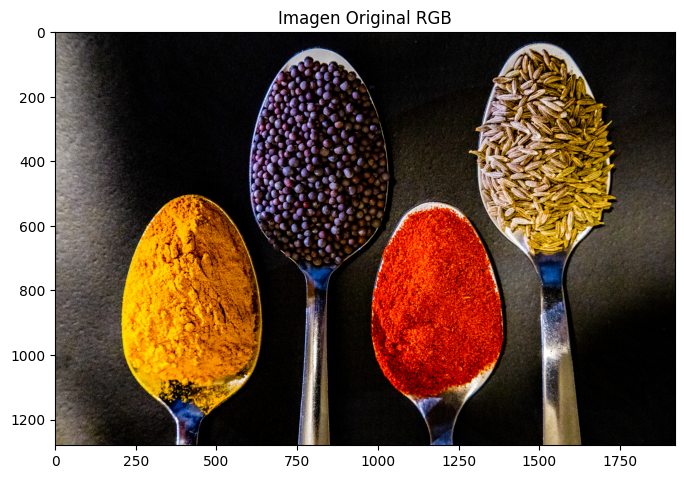

Mínimo: 0
Máximo: 255
Dimensiones de la imagen: (1280, 1920, 3)
Tipo de datos: uint8
Tamaño en memoria BGR(bytes): 7372800


In [30]:
imagen_especias = cv2.imread('especias-coloridas.jpg')
imagen_especias = cv2.cvtColor(imagen_especias, cv2.COLOR_BGR2RGB)

mostrar_imagen(imagen_especias, 'Imagen Original RGB', figsize=(8,8))
info_imagen(imagen_especias)

La imagen es de cuatro cucharas de condimentos que posee colores diferentes. Algo a tener en cuenta son las texturas que tiene la imagen y las sombras que generan, más adelante se podrá ver como influyen en el análisis. 

## Separación de canales RGB

Voy a mostrar la imagen en los distintos canales RGB. En cada uno se podrá ver la intensidad del color en cada canal.

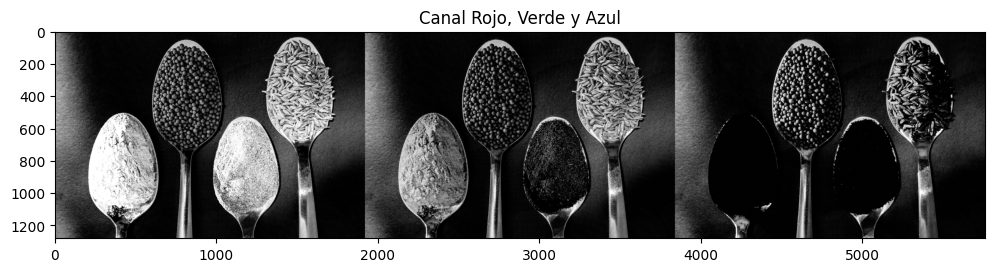

In [31]:
canal_rojo = obtener_canal(imagen_especias, "Rojo")
canal_verde = obtener_canal(imagen_especias, "Verde")
canal_azul = obtener_canal(imagen_especias, "Azul")

todas = np.hstack((canal_rojo, canal_verde, canal_azul))
mostrar_imagen(todas, "Canal Rojo, Verde y Azul", figsize=(12,8))


En el canal rojo podemos ver que de los cuatro objetos, dos poseen una alta intensidad del color y hay un tercero que parcialmente tiene una  claridad, esto puede indicar que tienen una mayor concentración de rojo en la composición de su tono, pudiendo o no reflejarse en una intensidad de color rojo. Esto difiere del canal azul que posee  más zonas de baja intensidad, el hecho que posea dos de los objetos con mayor oscuridad, indica que dentro de su composición de color poseen poca o nula tonalidad azul. 

El gráfico del canal verde posee zonas con intensidad de color, si bien este no se percibe en la foto original, puede indicar que ayuda a la formación de otro color.

### Histograma de los canales RGB

Veamos el histograma de cada canal.

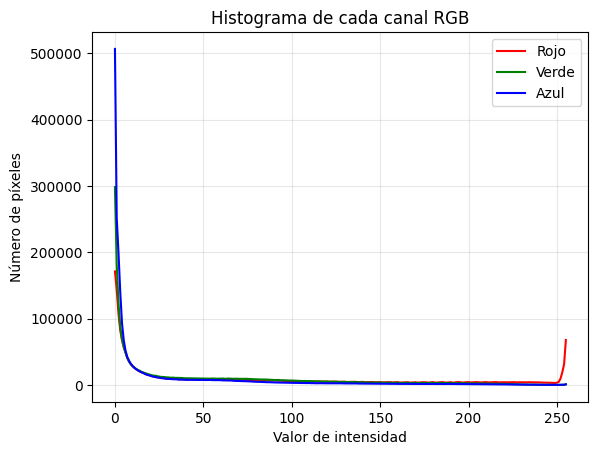

In [32]:
comparar_histograma_rgb(imagen_especias, "Histograma de cada canal RGB")

La imagen seleccionada posee muchos valores con poca intensidad en varios canales, el que resalta con alta intensidad es el canal rojo

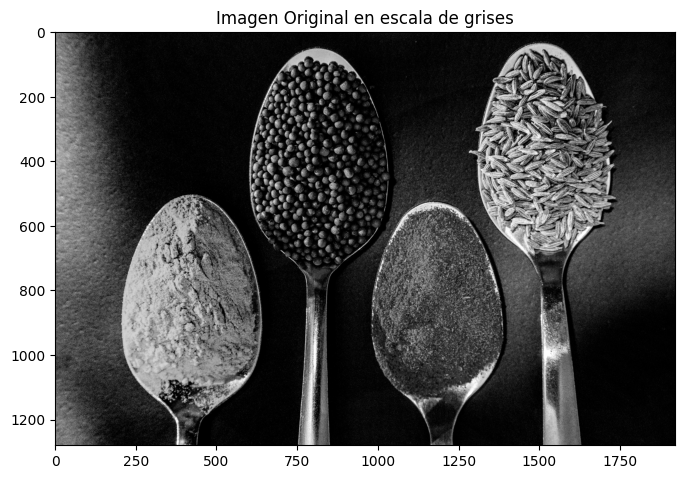

In [33]:
imagen_especias_gris = cv2.cvtColor(imagen_especias, cv2.COLOR_RGB2GRAY)
mostrar_imagen(imagen_especias_gris, 'Imagen Original en escala de grises', figsize=(8,8))

Vemos el histograma de la imagen en escala de grises

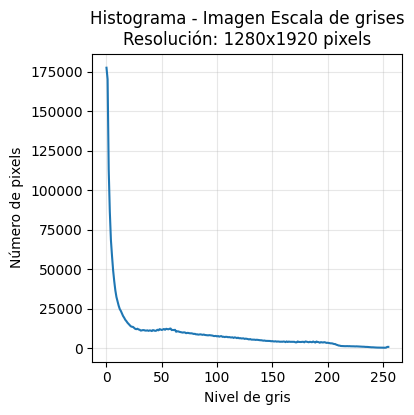

In [34]:
mostrar_histograma(imagen_especias_gris, "Escala de grises")

Del grafico podemos ver que mucho de los valores se centran en la poca intensidad, esto se refleja en la imagen porque hay muchas areas oscuras.

## Recorte imagen

Para el ejercicio voy a trabajar en separar este objeto 

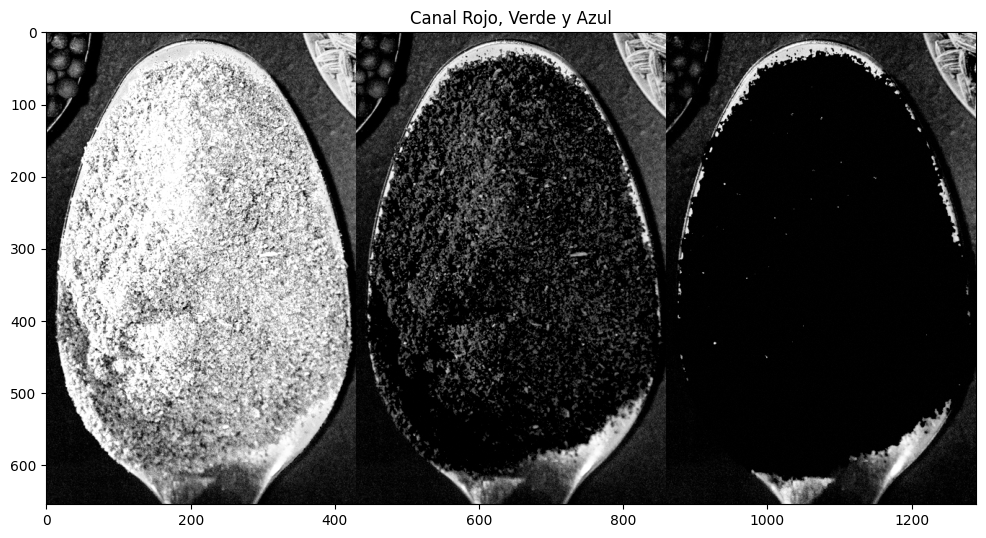

In [35]:
# Primero alto, despues ancho
imagen_especias_cropped = imagen_especias[515:1170, 965:1395]

canal_rojo_cropped = obtener_canal(imagen_especias_cropped, "Rojo")
canal_verde_cropped = obtener_canal(imagen_especias_cropped, "Verde")
canal_azul_cropped = obtener_canal(imagen_especias_cropped, "Azul")

todas = np.hstack((canal_rojo_cropped, canal_verde_cropped, canal_azul_cropped))
mostrar_imagen(todas, "Canal Rojo, Verde y Azul", figsize=(12,8))


### Histogramas del recorte

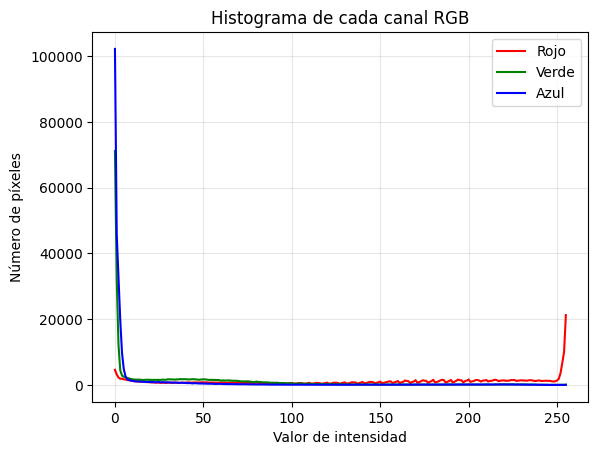

In [36]:
comparar_histograma_rgb(imagen_especias_cropped, "Histograma de cada canal RGB del recorte")

Luego de recortar la imagen se puede ver que que el rojo tiene mayor predominancia y se puede ver algunas intensidades intermedias.

Vamos a ver el histograma de la imagen transformada a escala de grises

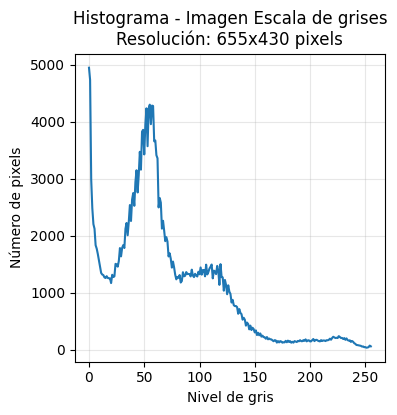

In [37]:
imagen_especias_cropped_gris = cv2.cvtColor(imagen_especias_cropped, cv2.COLOR_RGB2GRAY)
mostrar_histograma(imagen_especias_cropped_gris, "Escala de grises")

Se puede ver que hay mas variaciones de intensidad

### Selección de pixeles

Voy a seleccionar pixeles para poder seguir con la segmentación. Elijo varios para luego buscar el mínimo y máximo y continuar con el análisis 

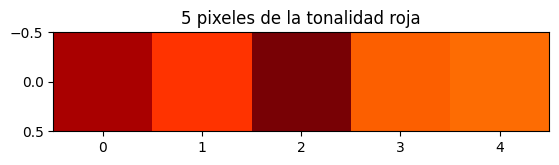

In [38]:
pixel_rojo_1 = imagen_especias_cropped[100, 200]
pixel_rojo_2 = imagen_especias_cropped[200, 200]
pixel_rojo_3 = imagen_especias_cropped[550, 150]
pixel_rojo_4 = imagen_especias_cropped[150, 150]
pixel_rojo_5 = imagen_especias_cropped[200, 180]

lista_pixeles = [pixel_rojo_1, pixel_rojo_2, pixel_rojo_3, pixel_rojo_4, pixel_rojo_5]

todas = np.vstack((lista_pixeles))

pixel_rojo_1_array = np.array([todas], dtype=np.uint8)

mostrar_imagen(pixel_rojo_1_array, "5 pixeles de la tonalidad roja") #veo el pixel elegido



De todos los pixeles vamos a utilizar la función "seleccionar_min_max_color_array" para encontrar los extremos

In [39]:
pixel_rojo_min, pixel_rojo_max = seleccionar_min_max_color_array(lista_pixeles)

Rango mínimo: [120   0   0]
Rango máximo: [255 108   5]


## Segmentación

Creamos la mascara para poder segmentar por color

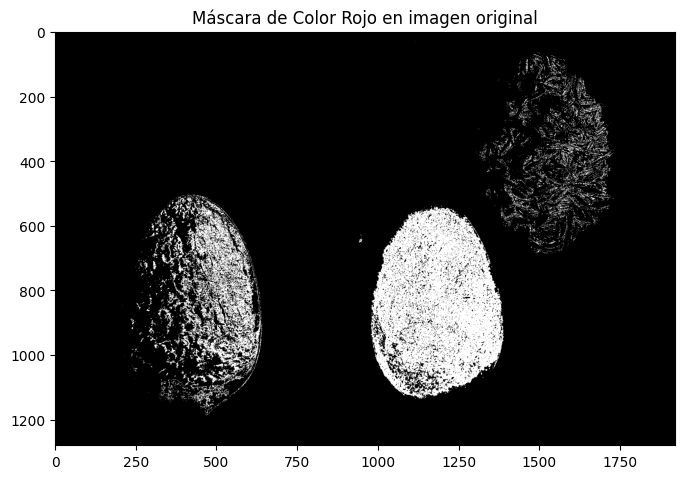

In [40]:
mascara = cv2.inRange(imagen_especias, pixel_rojo_min, pixel_rojo_max)
mostrar_imagen(mascara, "Máscara de Color Rojo en imagen original", figsize=(8,8))


Comparamos con la imagen original, le aplicamos la mascara y segmentamos 

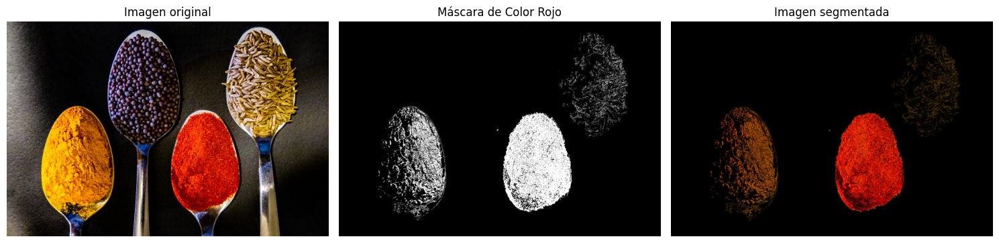

In [41]:
resultado_segmentacion = cv2.bitwise_and(imagen_especias, imagen_especias, mask=mascara)

comparar_imagenes_grilla(imagen_especias, mascara, resultado_segmentacion, "Máscara de Color Rojo", "Imagen segmentada")

## Desenfoque de imagen  

Voy a probar con la técnica de difusión mediante el desenfoque Gaussiano. Esto me sirve para eliminar ruido y suavizar la imagen antes de la segmentación, también suaviza bordes antes de detectar contornos.

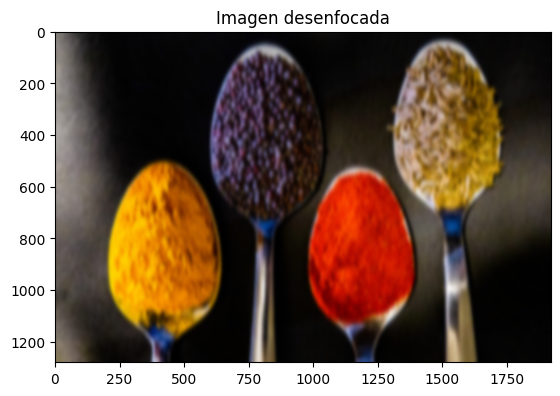

In [114]:
imagen_especias_blur = cv2.GaussianBlur(imagen_especias, (35, 65), 0)
mostrar_imagen(imagen_especias_blur, "Imagen desenfocada")

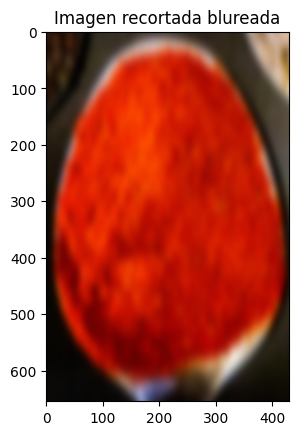

In [115]:
img_cropped_blur = imagen_especias_blur[515:1170, 965:1395]
mostrar_imagen(img_cropped_blur, "Imagen recortada blureada")

### Selección de pixeles

Se seleccionan píxeles de la imagen para encontrar las distintas tonalidades de color que posee el recorte.

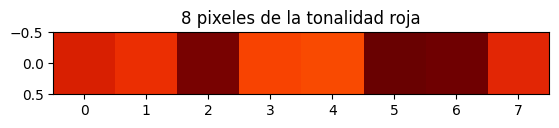

In [116]:
img_cropped = imagen_especias_blur[515:1170, 965:1395]

#pixel_rojo_1 = img_cropped[100, 200]
#pixel_rojo_2 = img_cropped[340, 110]
#pixel_rojo_3 = img_cropped[550, 150]
#pixel_rojo_4 = img_cropped[150, 150]
#pixel_rojo_5 = img_cropped[200, 180]
#pixel_rojo_6 = img_cropped[580, 150]
#pixel_rojo_7 = img_cropped[570, 150]
#pixel_rojo_8 = img_cropped[427, 72]
#ubicacion_pixeles = [(100, 200), (340, 110), (550, 150), (150, 150), (200, 180), (580, 153), (570, 150), (427, 72)]

#lista_pixeles = [pixel_rojo_1, pixel_rojo_2, pixel_rojo_3, pixel_rojo_4, pixel_rojo_5, pixel_rojo_6, pixel_rojo_7, pixel_rojo_8]

ubicacion_pixeles = [(100, 200), (340, 110), (550, 150), (150, 150), (200, 180), (580, 152), (570, 150), (427, 72)]

# Extraer los valores de los píxeles en una sola línea
lista_pixeles = [img_cropped[y, x] for y, x in ubicacion_pixeles]


todas = np.vstack((lista_pixeles))
barra_pixel_rojo = np.array([todas], dtype=np.uint8)

mostrar_imagen(barra_pixel_rojo, f"{len(lista_pixeles)} pixeles de la tonalidad roja") #veo el pixel elegido


In [117]:
pixel_rojo_min_array, pixel_rojo_max_array = seleccionar_min_max_color_array(lista_pixeles)
#pixel_rojo_max_array = np.array([[249,30,3]], dtype=np.uint8)


Rango mínimo: [105   0   1]
Rango máximo: [249  74   5]


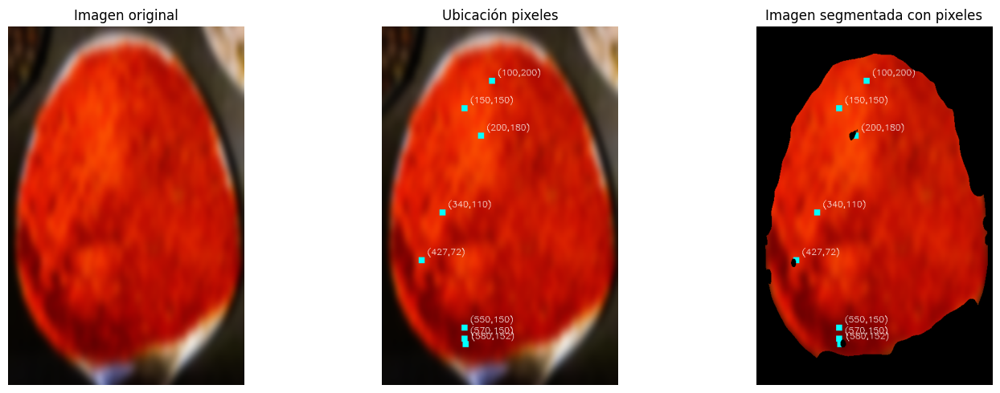

In [118]:
img_cropped_blur_pixeles = img_cropped_blur.copy()
mascara_img_cropped_blur = cv2.inRange(img_cropped_blur, pixel_rojo_min_array, pixel_rojo_max_array)

for y, x in ubicacion_pixeles:
    cv2.rectangle(img_cropped_blur_pixeles, (x-5, y-5), (x+5, y+5), (0, 255, 255), -1)
for y, x in ubicacion_pixeles:
    cv2.putText(img_cropped_blur_pixeles, f"({y},{x})", (x+10, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

#mostrar_imagen(img_cropped_blur_pixeles, "Ubicación de los píxeles")
resultado_blur_cropped = cv2.bitwise_and(img_cropped_blur_pixeles, img_cropped_blur_pixeles, mask=mascara_img_cropped_blur)

#mostrar_imagen(resultado_blur_cropped, "Ubicación de los píxeles")
comparar_imagenes_grilla(img_cropped_blur, img_cropped_blur_pixeles, resultado_blur_cropped, "Ubicación pixeles", "Imagen segmentada con pixeles")

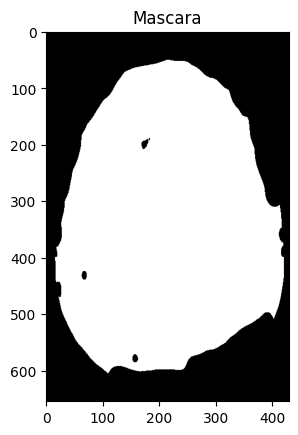

In [119]:
#img_cropped_blur
mascara_img_cropped_blur = cv2.inRange(img_cropped_blur, pixel_rojo_min_array, pixel_rojo_max_array)


mostrar_imagen(mascara_img_cropped_blur, "Mascara")


### Probando con pocos pixeles

Al principio seleccionaba solamente tres pixeles y me pasaba que no completaba la segmentación. Por eso decidí agregar más pixeles.

Rango mínimo: [120   2   1]
Rango máximo: [235  46   2]


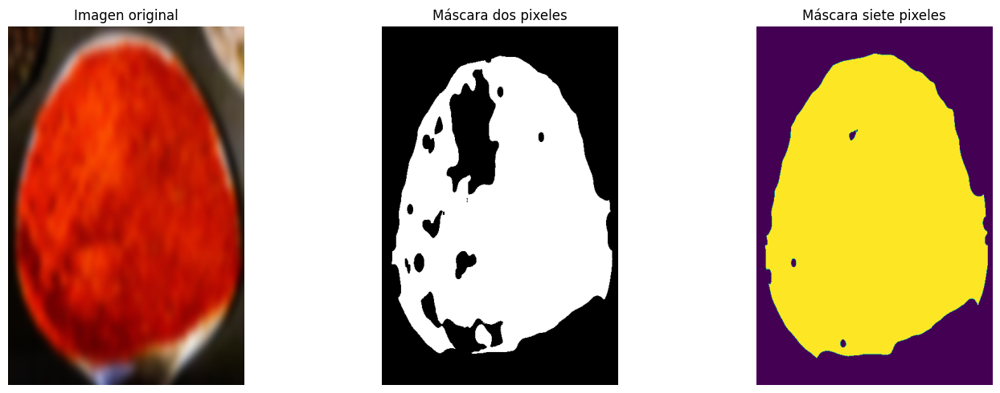

In [120]:
pixel_rojo_min_array_v2, pixel_rojo_max_array_v2 = seleccionar_min_max_color_array([pixel_rojo_3, pixel_rojo_2])
mascara_blur_v2_crop = cv2.inRange(img_cropped_blur, pixel_rojo_min_array_v2, pixel_rojo_max_array_v2)


comparar_imagenes_grilla(
    img_cropped_blur, 
    mascara_blur_v2_crop, 
    mascara_img_cropped_blur, 
    "Máscara dos pixeles", 
    "Máscara siete pixeles")

### Imagen segmentada

Luego de obtener un mejor resultado en la aplicación de la mascara, veamos como queda la imagen

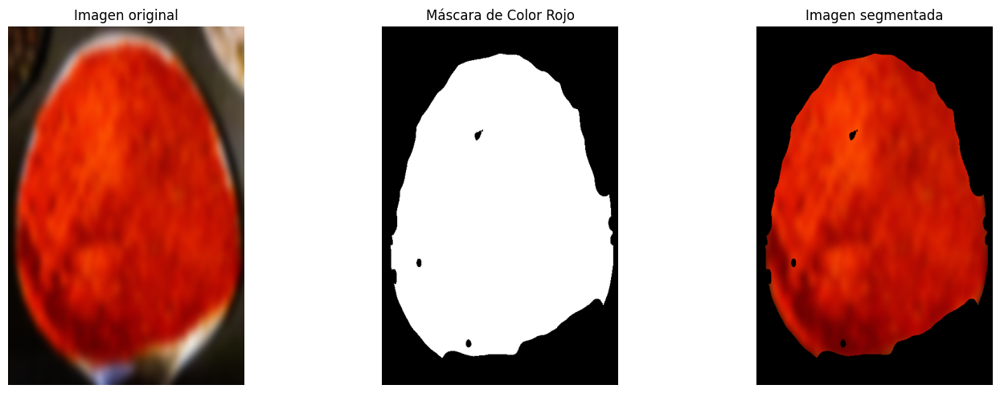

In [121]:
resultado_blur_cropped = cv2.bitwise_and(img_cropped_blur, img_cropped_blur, mask=mascara_img_cropped_blur)

comparar_imagenes_grilla(img_cropped_blur, mascara_img_cropped_blur, resultado_blur_cropped, "Máscara de Color Rojo", "Imagen segmentada")



## Segmentar la imagen completa

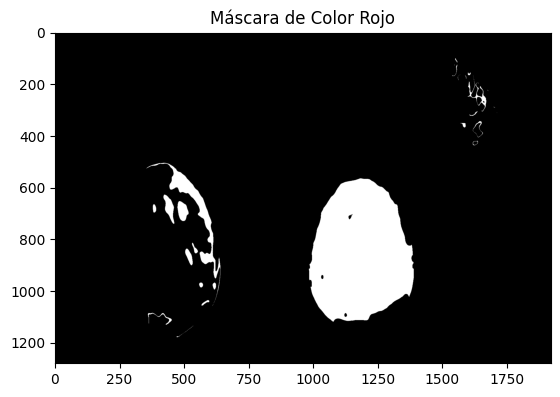

In [122]:
mascara_img_blur = cv2.inRange(imagen_especias_blur, pixel_rojo_min_array, pixel_rojo_max_array)
mostrar_imagen(mascara_img_blur, "Máscara de Color Rojo")

### Segmentación en imagen con desenfoque

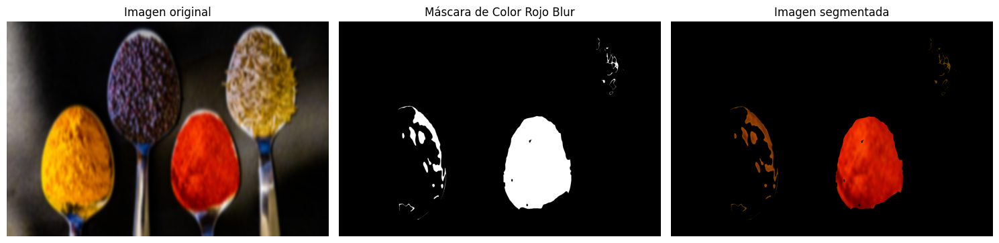

In [123]:
resultado_blur = cv2.bitwise_and(imagen_especias_blur, imagen_especias_blur, mask=mascara_img_blur)

comparar_imagenes_grilla(imagen_especias_blur, mascara_img_blur, resultado_blur, "Máscara de Color Rojo Blur", "Imagen segmentada")


### Segmentación en imagen original

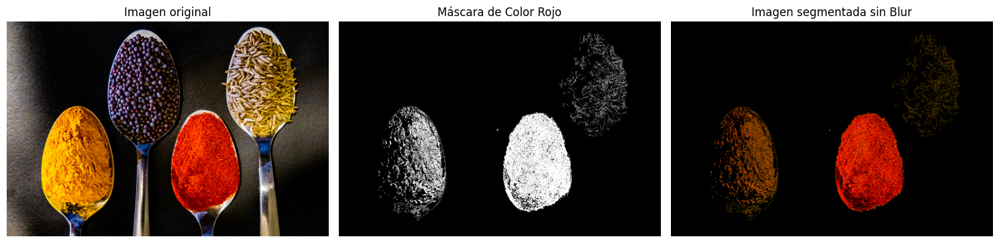

In [124]:
comparar_imagenes_grilla(imagen_especias, mascara, resultado_segmentacion, "Máscara de Color Rojo", "Imagen segmentada sin Blur")


### Comparación

Luego de realizar el blureado a la imagen original como resultado obtuve una mejor separación del color. Aún quedan rastros en en otros objetos, esto se puede deber a que poseen valores del canal rojo en su composición. Aún así se puede apreciar la diferencia entre las dos segmentaciones, el color de la segmentación es más sólido a diferencia de la original que al tener textura se refleja en las tonalidades.

### Morphological Operations

Para mejorar la segmentación se necesita eliminar aquellos pixeles que no corresponden al elemento que se desea separar. En este caso el objeto de la cuchara con el condimento amarillo, posee ciertos tonos del rojo que se marcan en la segmentación.

La técnica de filtrar ruido con operaciones morfológicas, elimina el ruido de algunos pixeles. Existen muchos usos para esta libreria

morphologyEx de Python OpenCV es una técnica de procesamiento de imágenes que trabajan con la forma de los objetos en una imagen. Esta estrategia de procesamiento generalmente se aplica a imágenes binarias.

Las operaciones morfológicas en OpenCV incluyen:

Erosion, Dilation, Opening, Closing, Morphological, Gradient, Top hat, Black hat

Para todas estas técnicas, los dos requisitos fundamentales son:  Una imagen binaria y un elemento estructurante (kernel) que se desliza sobre la imagen para aplicar la transformación.

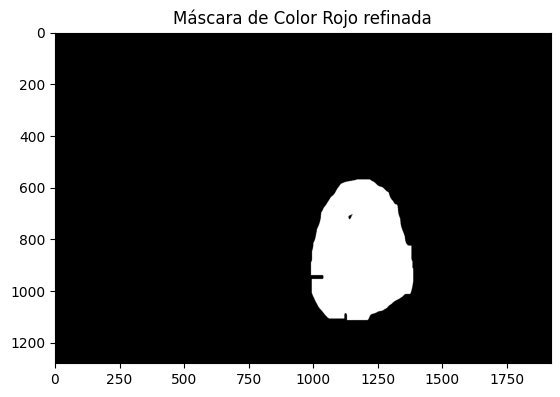

In [152]:
kernel = np.ones((13, 13), np.uint8)  # Tamaño del filtro
mascara_img_blur_morf = cv2.morphologyEx(mascara_img_blur, cv2.MORPH_OPEN, kernel, iterations=4)
mostrar_imagen(mascara_img_blur_morf, "Máscara de Color Rojo refinada")

Se elimino que aparezca otro objeto, ahora vamos a rellenar un poco algunos espacios

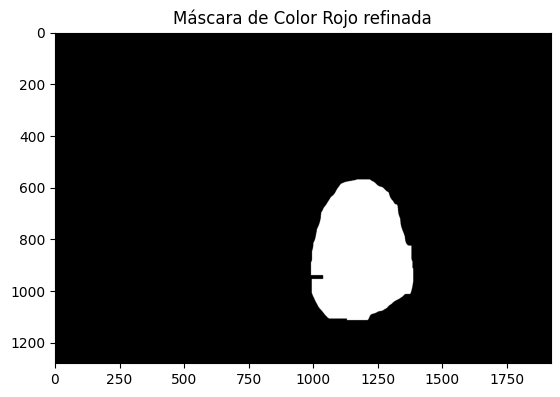

In [155]:
mascara_refinada = cv2.morphologyEx(mascara_img_blur_morf, cv2.MORPH_CLOSE, kernel)
mostrar_imagen(mascara_refinada, "Máscara de Color Rojo refinada")


Rectángulo

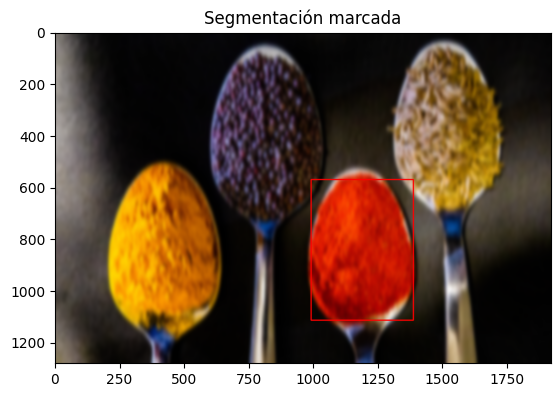

In [158]:
# Obtener contornos de la máscara
contornos, _ = cv2.findContours(mascara_refinada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Creo copia para no modigicar la imagen original
imagen_especias_blur_rectangulo = imagen_especias_blur.copy()
# Dibujar el rectángulo si se encontró algún objeto segmentado
for contorno in contornos:
    x, y, w, h = cv2.boundingRect(contorno)  # Coordenadas del rectángulo
    cv2.rectangle(imagen_especias_blur_rectangulo, (x, y), (x + w, y + h), (255, 0, 0), 3)  # Azul en BGR

# Mostrar la imagen con la segmentación marcada
mostrar_imagen(imagen_especias_blur_rectangulo, "Segmentación marcada")

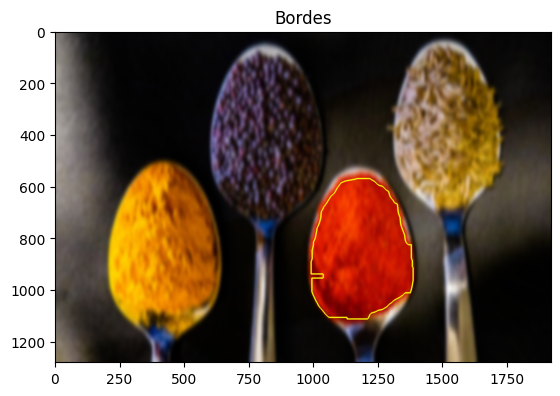

In [167]:
# Paso 1: encontrar los contornos en la máscara
contornos, _ = cv2.findContours(mascara_refinada, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Paso 2: copiar la imagen original para no modificarla
imagen_especias_blur_bordes = imagen_especias_blur.copy()  # Asegurate de que esté en RGB

# Paso 3: dibujar los contornos sobre la imagen
cv2.drawContours(imagen_especias_blur_bordes, contornos, -1, color=(255, 255, 10), thickness=4)  # rojo
mostrar_imagen(imagen_especias_blur_bordes, "Bordes")

El borde lo cambie a color mas claro para que se note del rojo que es el objeto

## Conclusión
Luego de realizar el ejercicio integrador pude ver manipular distintas imagenes y modificarlas mediante librerias, la mayoria de Open CV. Esto me permitio entender los conceptos del color que no había visto antes. Me parecio interesante la parte de segmentar porque pensaba que el filtrar por un color sería mas fácil, usando pocos parametros, pero viendo como es que se componen los colores vi que hay muchas cosas que no se ven al ojo humano como la composición de un color los algoritmos lo pueden detectar.
Estas herramientas poseen varias trabas en el momento de trabajar pero requieren mayor entendimiento sobre su comportamiento, y como hay varias librerias que ayudan, tales como en la segmentación ayudaron el blureado y también las operaciones morfológicas.
Seguramente existen otras herramientas que con clic te permiten realizar este trabajo pero es interasante ver como funcionan las cosas por detrás para poder elaborar en un futuro algoritmos de IA en el área de imágenes.